<a href="https://colab.research.google.com/github/motho17/U-SAM-hybrid-model/blob/main/Integrated_model(SAM_%2B_U_Net).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Integrated model implementation(SAM + U-Net)**

This code contains the implementation of the proposed model.The integration between U-Net and SAM model with SAM encoder frozen is worked out using the code below.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! nvidia-smi

Sat Aug 19 14:34:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Install and import libraries

In [ ]:
!pip install torchio
!pip install torchsummary
using_colab = True
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    # !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'




     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.8/172.8 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 14.8 MB/s eta 0:00:00
PyTorch version: 2.0.1+cu118
Torchvision version: 0.15.2+cu118
CUDA is available: True


##SAM Model import
To be able to use a higher batch size than one,The SAM model mask decoder had to be editted to not expand the image embedding.This is an import of the editted SAM model.

In [ ]:
import sys
import importlib

sys.path.append('/content/drive/MyDrive')
# usam = importlib.import_module('U-SAM-hybrid-model')
from sam.segment_anything import sam_model_registry,SamAutomaticMaskGenerator, SamPredictor
from sam.segment_anything.utils.transforms import ResizeLongestSide

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import glob
import os
import cv2
import nibabel as nib
from torch.utils.data import Dataset,DataLoader
from torchvision import transforms as pth_transforms
from PIL import Image
import random
from tqdm import tqdm
import pandas as pd
from sklearn.preprocessing import MinMaxScaler #scale values
import time
import torchio as tio
import torch.nn as nn

import tempfile
import albumentations as A
import albumentations.augmentations.functional as F
from albumentations.pytorch import ToTensorV2
import sklearn
from sklearn.model_selection import StratifiedKFold
from skimage.util import montage

## Get the data

In [ ]:
!unzip '/content/drive/MyDrive/BraTs2.zip' -d '/content/BraTs2020'

Streaming output truncated to the last 5000 lines.
  inflating: /content/BraTs2020/content/BraTs2/3830/t2.jpg  
  inflating: /content/BraTs2020/content/BraTs2/3830/seg.jpg  
   creating: /content/BraTs2020/content/BraTs2/4529/
  inflating: /content/BraTs2020/content/BraTs2/4529/t1ce.jpg  
  inflating: /content/BraTs2020/content/BraTs2/4529/flair.jpg  
  inflating: /content/BraTs2020/content/BraTs2/4529/t1.jpg  
  inflating: /content/BraTs2020/content/BraTs2/4529/t2.jpg  
  inflating: /content/BraTs2020/content/BraTs2/4529/seg.jpg  
   creating: /content/BraTs2020/content/BraTs2/20978/
  inflating: /content/BraTs2020/content/BraTs2/20978/t1ce.jpg  
  inflating: /content/BraTs2020/content/BraTs2/20978/flair.jpg  
  inflating: /content/BraTs2020/content/BraTs2/20978/t1.jpg  
  inflating: /content/BraTs2020/content/BraTs2/20978/t2.jpg  
  inflating: /content/BraTs2020/content/BraTs2/20978/seg.jpg  
   creating: /content/BraTs2020/content/BraTs2/27801/
  inflating: /content/BraTs2020/conten

splittig the data into training and validation

In [ ]:
from glob import glob
import os
imgs_dir='/content/BraTs2020/content/BraTs2'
all_dirs = glob (f'{imgs_dir}/*')
all_dirs = all_dirs
# print(len(all_dirs))
all_dirs.sort()
def shuffle_split (all_dirs, val_pct = 0.15, seed = 99):
    """ shuffling dataset with random state and split to train and valid """
    n_val = int (len (all_dirs) * val_pct)
    np.random.seed (seed)
    idx = np.random.permutation (len (all_dirs))
    all_dirs = np.array (all_dirs) [idx]

    return all_dirs [n_val:], all_dirs [:n_val]

train_dirs, valid_dirs = shuffle_split (all_dirs, seed = 1)
print(len(valid_dirs)), print(len(train_dirs))

5307
30073


(None, None)

## Dataset class

A class for loading and preprocessing the images,the preprocessing steps include normalization,augmentation,resizing and stacking the images



In [ ]:
class BratsDataset (Dataset):
  def __init__ (self, img_dirs, modality_types, transform = None):
      self.img_dirs = img_dirs
      self.transform = transform

  def __len__ (self):
      return len (self.img_dirs)

  def __getitem__ (self, index):
      imgs_path = self.img_dirs [index]
      image = self.concat_imgs (imgs_path)
      mask = np.array (Image.open (f'{imgs_path}/seg.jpg'))
      mask = (mask / 255 * 4).round ()
      mask = self.preprocess_mask_labels(mask)

      image = image.transpose(2, 1, 0)  # (B, H, W, C) to (B, C, H, W)
      mask = mask.transpose(2, 1, 0)  # (C, H, W) to (B, C, H, W)
      # print(image.shape)
      # print(mask.shape)


      if self.transform is not None:
          augmented = self.transform(image = image, mask = mask)
          image = augmented ['image']
          mask = augmented ['mask']
      image = image.permute(0,1,2)  # (B, H, W, C) to (B, C, H, W)
      mask = mask.permute(2, 0, 1)  # (C, H, W) to (B, C, H, W)
      # print(image.shape)
      # print(mask.shape)
      bboxes = self.get_bounding_box(mask)


      # return image.astype(float), mask.astype(float),bboxes
      # return image.float(), mask.float(),bboxes
      # return image.astype(np.float), mask.astype(np.float),bboxes
      return image,mask,bboxes


  def concat_imgs (self, path: str):
      types = []
      for modality_type in modality_types:
          img = np.array (Image.open (f'{path}/{modality_type}.jpg'))
          img = self.normalize(img)
          types.append (img)
#         cat_img = np.concatenate (types, axis = -1)

      return np.array(types)
  def get_bounding_box(self, mask):
    ground_truth_map = mask[0]# Extract the first channel of the mask

    # Find the indices of non-zero elements in the ground truth map
    y_indices, x_indices = np.where(ground_truth_map > 0)

    # Calculate the minimum and maximum values for x and y coordinates
    try:
      x_min = np.min(x_indices)
      y_min = np.min(y_indices)
      x_max = np.max(x_indices)
      y_max = np.max(y_indices)

    except ValueError:
      x_min = 0
      y_min = 0
      x_max = 0
      y_max = 0
    bboxes = np.array([x_min, y_min, x_max, y_max])

    return bboxes

  def preprocess_mask_labels(self, mask: np.ndarray):
      mask_WT = np.zeros(mask.shape)
      mask_WT[mask == 2] = 1

      mask_TC = np.zeros(mask.shape)
      mask_TC[mask == 1] = 1

      mask_ET = np.zeros(mask.shape)
      mask_ET[mask == 3] = 1

      mask_BG = np.zeros(mask.shape)
      mask_BG[mask == 0] = 1

      mask = np.stack([mask_WT, mask_TC, mask_ET])#, mask_BG
      # mask = np.moveaxis(mask, (0, 1, 2), (0, 2, 1))
      return mask

  def normalize(self, data: np.ndarray):
      data_min = np.min(data)
      if np.max(data) == 0:
          return data
      if (np.max(data) - data_min) == 0:
          return data / data_min

      return (data - data_min) / (np.max(data) - data_min)


modality_types = ['flair', 't1', 't1ce']#,'t2'

trn_tfms = A.Compose([
    A.Resize(height=256, width=256),

    A.HorizontalFlip (p = 0.5),

    ToTensorV2(),
])

val_tfms = A.Compose([
    A.Resize(height=256, width=256),
    ToTensorV2(),
])


## Data Loader
Train and validation data loader.With a batch size of 10 for the training set which is the maximum allowable due to GPU memory limits.

In [ ]:
train_ds = BratsDataset(train_dirs, modality_types,transform = trn_tfms)
train_dl = DataLoader(train_ds, batch_size = 10, shuffle = False, num_workers = 4, pin_memory = True)

valid_ds = BratsDataset(valid_dirs, modality_types,transform = val_tfms)
valid_dl = DataLoader(valid_ds, batch_size = 1, shuffle = False, num_workers = 2, pin_memory = True)



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


confirming the image,mask and bbox sizes

In [ ]:
for images,masks,bboxes in valid_dl:
   print(f"{images.shape=}, {masks.shape=},{bboxes.shape=}")
   val, counts = np.unique(masks, return_counts=True)
   if(1 - (counts[0]/counts.sum())) > 0.01:
    print('yes')
   else:
    print('no')

   print(bboxes)
   break

images.shape=torch.Size([1, 3, 256, 256]), masks.shape=torch.Size([1, 3, 256, 256]),bboxes.shape=torch.Size([1, 4])
no
tensor([[ 86, 115, 114, 125]])


##  Models defininition
### Class U-Net
  This is the U-Net architecture to be used as an encoder in the integrartion.

In [ ]:
#UNET model
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)


class DownBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DownBlock, self).__init__()
        self.double_conv = DoubleConv(in_channels, out_channels)
        self.down_sample = nn.MaxPool2d(2)

    def forward(self, x):
        skip_out = self.double_conv(x)
        down_out = self.down_sample(skip_out)
        return (down_out, skip_out)


class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, up_sample_mode):
        super(UpBlock, self).__init__()
        if up_sample_mode == 'conv_transpose':
            self.up_sample = nn.ConvTranspose2d(in_channels-out_channels, in_channels-out_channels, kernel_size=2, stride=2)
        elif up_sample_mode == 'bilinear':
            self.up_sample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            raise ValueError("Unsupported `up_sample_mode` (can take one of `conv_transpose` or `bilinear`)")
        self.double_conv = DoubleConv(in_channels, out_channels)

    def forward(self, down_input, skip_input):
        x = self.up_sample(down_input)
        x = torch.cat([x, skip_input], dim=1)
        return self.double_conv(x)


class UNet(nn.Module):
    def __init__(self, out_classes=3, up_sample_mode='conv_transpose'):
        super(UNet, self).__init__()
        self.up_sample_mode = up_sample_mode
        # Downsampling Path
        self.down_conv1 = DownBlock(3, 64)
        self.down_conv2 = DownBlock(64, 128)
        self.down_conv3 = DownBlock(128, 256)
        self.down_conv4 = DownBlock(256, 512)
        # Bottleneck
        self.double_conv = DoubleConv(512, 1024)
        # Upsampling Path
        self.up_conv4 = UpBlock(512 + 1024, 512, self.up_sample_mode)
        self.up_conv3 = UpBlock(256 + 512, 256, self.up_sample_mode)
        self.up_conv2 = UpBlock(128 + 256, 128, self.up_sample_mode)
        self.up_conv1 = UpBlock(128 + 64, 64, self.up_sample_mode)
        # Final Convolution
        self.conv_last = nn.Conv2d(64, out_classes, kernel_size=1)

    def forward(self, x,multimask_output = None, image_size =None):
        x, skip1_out = self.down_conv1(x)
        x, skip2_out = self.down_conv2(x)
        x, skip3_out = self.down_conv3(x)
        x, skip4_out = self.down_conv4(x)
        x = self.double_conv(x)
        x = self.up_conv4(x, skip4_out)
        x = self.up_conv3(x, skip3_out)
        x = self.up_conv2(x, skip2_out)
        x = self.up_conv1(x, skip1_out)
        x = self.conv_last(x)
        # x = self.sam(x, multimask_output=multimask_output, image_size=image_size, CNN_input = cnn_out)

        return x


### Loading SAM model checkpoints

In [ ]:
# from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "/content/drive/MyDrive/SAM/sam_vit_b_01ec64.pth"
model_type = "vit_b"

device = "cuda"

sam_model = sam_model_registry[model_type](checkpoint=sam_checkpoint,num_classes = 3)
sam_model.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam_model)

In [ ]:
sam_model.to(device=device)
unet_model = UNet()
unet_model.to(device=device)


UNet(
  (down_conv1): DownBlock(
    (double_conv): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (down_sample): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down_conv2): DownBlock(
    (double_conv): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      

### Integrated model Class
This class contains the Integration code the features from U-NET and SAM encoder are resized and passed through the learnable gate.

In [ ]:
class IntegratedModel(nn.Module):
    def __init__(self,sam,unet):
        super(IntegratedModel, self).__init__()

        self.sam_encoder = sam.image_encoder
        self.sam_decoder = sam.mask_decoder
        self.unet_encoder = unet
        self.alpha = nn.Parameter(torch.zeros(1))
        self.Sigmoid = nn.Sigmoid()

    def forward(self, x,box_torch):
        u_input = x
        unet_features = self.unet_encoder(u_input)
        image_embedding = x
        sam_trans = ResizeLongestSide(sam_model.image_encoder.img_size)
        trans_image = sam_trans.apply_image_torch(image_embedding)

        sam_features = self.sam_encoder(trans_image)
        gate = self.Sigmoid(self.alpha)
        unet_features = self.resize(unet_features, sam_features.size()[2:])
        unet_features = torch.mean(unet_features, dim=1, keepdim=True)
        integrated_features = gate*sam_features + (1-gate) * unet_features

        sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                points=None,
                boxes=box_torch,
                masks=None,
            )

        output, _ = self.sam_decoder(
            image_embeddings=integrated_features.to(device), # (B, 256, 64, 64)
            image_pe=sam_model.prompt_encoder.get_dense_pe(), # (1, 256, 64, 64)
            sparse_prompt_embeddings=sparse_embeddings, # (B, 2, 256)
            dense_prompt_embeddings=dense_embeddings, #dense_embeddings.repeat(image_embedding.size(0), 1, 1, 1), # (B, 256, 64, 64)
            multimask_output=True,
          )
        return output

    def resize(self, x, size):
        return nn.functional.interpolate(x, size=size, mode='bilinear', align_corners=False)


freezing the SAM encoder

In [ ]:
for param in sam_model.image_encoder.parameters():
    param.requires_grad = False


In [ ]:
model = IntegratedModel(sam_model, unet_model)
model.to(device=device)


IntegratedModel(
  (sam_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2

In [ ]:
!pip install monai
!pip install tensorboardX


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 2.5 MB/s eta 0:00:00


## Defining the evaluation metrics
Dice score and IoU Score

In [ ]:
from torch.autograd import Function
class DiceCoeff(Function):
    """Dice coeff for individual examples"""

    def forward(self, input, target):
        self.save_for_backward(input, target)
        eps = 0.0001
        self.inter = torch.dot(input.view(-1), target.view(-1))
        self.union = torch.sum(input) + torch.sum(target) + eps

        t = (2 * self.inter.float() + eps) / self.union.float()
        return t

    # This function has only a single output, so it gets only one gradient
    def backward(self, grad_output):

        input, target = self.saved_variables
        grad_input = grad_target = None

        if self.needs_input_grad[0]:
            grad_input = grad_output * 2 * (target * self.union - self.inter) \
                         / (self.union * self.union)
        if self.needs_input_grad[1]:
            grad_target = None

        return grad_input, grad_target


def dice_coeff(input, target):
    """Dice coeff for batches"""
    if input.is_cuda:
        s = torch.FloatTensor(1).to(device = input.device).zero_()
    else:
        s = torch.FloatTensor(1).zero_()

    for i, c in enumerate(zip(input, target)):
        s = s + DiceCoeff().forward(c[0], c[1])

    return s / (i + 1)

def iou(outputs: np.array, labels: np.array):

    SMOOTH = 1e-6
    intersection = (outputs & labels).sum((1, 2))
    union = (outputs | labels).sum((1, 2))

    iou = (intersection + SMOOTH) / (union + SMOOTH)


    return iou.mean()

def eval_seg(pred,true_mask_p,threshold):
    '''
    threshold: a int or a tuple of int
    masks: [b,2,h,w]
    pred: [b,2,h,w]
    '''
    b, c, h, w = pred.size()
    if c == 2:
        iou_d, iou_c, disc_dice, cup_dice = 0,0,0,0
        for th in threshold:

            gt_vmask_p = (true_mask_p > th).float()
            vpred = (pred > th).float()
            vpred_cpu = vpred.cpu()
            disc_pred = vpred_cpu[:,0,:,:].numpy().astype('int32')
            cup_pred = vpred_cpu[:,1,:,:].numpy().astype('int32')

            disc_mask = gt_vmask_p [:,0,:,:].squeeze(1).cpu().numpy().astype('int32')
            cup_mask = gt_vmask_p [:, 1, :, :].squeeze(1).cpu().numpy().astype('int32')

            '''iou for numpy'''
            iou_d += iou(disc_pred,disc_mask)
            iou_c += iou(cup_pred,cup_mask)

            '''dice for torch'''
            disc_dice += dice_coeff(vpred[:,0,:,:], gt_vmask_p[:,0,:,:]).item()
            cup_dice += dice_coeff(vpred[:,1,:,:], gt_vmask_p[:,1,:,:]).item()

        return iou_d / len(threshold), iou_c / len(threshold), disc_dice / len(threshold), cup_dice / len(threshold)
    else:
        eiou, edice = 0,0
        for th in threshold:

            gt_vmask_p = (true_mask_p > th).float()
            vpred = (pred > th).float()
            vpred_cpu = vpred.cpu()
            disc_pred = vpred_cpu[:,0,:,:].numpy().astype('int32')

            disc_mask = gt_vmask_p [:,0,:,:].squeeze(1).cpu().numpy().astype('int32')

            '''iou for numpy'''
            eiou += iou(disc_pred,disc_mask)

            '''dice for torch'''
            edice += dice_coeff(vpred[:,0,:,:], gt_vmask_p[:,0,:,:]).item()

        return eiou / len(threshold), edice / len(threshold)


## Train function

In [ ]:
from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
)
from monai.metrics import DiceMetric
# from segment_anything import sam_model_registry
# from segment_anything.utils.transforms import ResizeLongestSide


GPUdevice = "cuda"
pos_weight = torch.ones([1]).cuda(device=GPUdevice)*2
criterion_G = torch.nn.BCEWithLogitsLoss(pos_weight=pos_weight)
seed = torch.randint(1,11,(1,7))

torch.backends.cudnn.benchmark = True
loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
scaler = torch.cuda.amp.GradScaler()
max_iterations = 20#number of iterations
post_label = AsDiscrete(to_onehot=3)
post_pred = AsDiscrete(argmax=True, to_onehot= 3)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
dice_val_best = 0.0
global_step_best = 0
epoch_loss_values = []
metric_values = []
train_logs = []


def train_usam(model, optimizer, train_loader,
          epoch,vis = 50, schedulers=None):
    hard = 0
    epoch_loss = 0
    ind = 0
    # train mode
    model.train()
    optimizer.zero_grad()
    threshold = (0.1, 0.3, 0.5, 0.7, 0.9)

    epoch_loss = 0
    GPUdevice = "cuda"
    use_amp = False

    device = GPUdevice
    # lossfunc = DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')
    if use_amp:
        lossfunc = DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')
    else:
        lossfunc = criterion_G

    for param in sam_model.image_encoder.parameters():
            param.requires_grad = False



    with tqdm(total=len(train_loader), desc=f'Epoch {epoch}', unit='img') as pbar:
        for image_embedding, gt2D, boxes in train_loader:
          # val, counts = np.unique(gt2D, return_counts=True)
          # if(1 - (counts[0]/counts.sum())) > 0.01:
            # sam_trans = ResizeLongestSide(sam_model.image_encoder.img_size)
            # trans_image = sam_trans.apply_image_torch(image_embedding)
            image_embedding = image_embedding.float()
            image_embedding = image_embedding.to(device)
            # print(image_embedding.shape)

            mask = gt2D.to(device)
            box_np = boxes.numpy()
            sam_trans = ResizeLongestSide(sam_model.image_encoder.img_size)
            box = sam_trans.apply_boxes(box_np, (mask.shape[-2], mask.shape[-1]))
            box_torch = torch.as_tensor(box, dtype=torch.float, device=device)
            if len(box_torch.shape) == 2:
                box_torch = box_torch[:, None, :] # (B, 1, 4)

            # Forward pass
            outputs = model(image_embedding,box_torch)


            # Backward pass
            loss = lossfunc(outputs, mask)



            pbar.set_postfix(**{'loss (batch)': loss.item()})
            epoch_loss += loss.item()

            loss.backward()
            train_logs.append(epoch_loss)
            # nn.utils.clip_grad_value_(net.parameters(), 0.1)
            optimizer.step()
            optimizer.zero_grad()

            cleanup_interval = 4 # Adjust as needed
            if (ind + 1) % cleanup_interval == 0:
                torch.cuda.empty_cache()


            # '''vis images'''
            # if vis:
            #     if ind % vis == 0:
            #         namecat = 'Train'
            #         for na in name:
            #             namecat = namecat + na.split('/')[-1].split('.')[0] + '+'
            #         vis_image(imgs,pred,masks, os.path.join(args.path_helper['sample_path'], namecat+'epoch+' +str(epoch) + '.jpg'), reverse=False, points=showp)

            pbar.update()

    return loss

## Validation function

In [ ]:

def validation_usam(val_loader, epoch, model, clean_dir=True):
     # eval mode
    model.eval()

    mask_type = torch.float32
    n_val = len(val_loader)  # the number of batch
    ave_res, mix_res = (0,0,0,0), (0,0,0,0)
    rater_res = [(0,0,0,0) for _ in range(6)]
    tot = 0
    hard = 0
    threshold = (0.1, 0.3, 0.5, 0.7, 0.9)
    GPUdevice = torch.device('cuda:' + str(0))
    device = GPUdevice
    evl_chunk = None
    n_val = len(val_loader)

    lossfunc = DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')


    with tqdm(total=n_val, desc='Validation round', unit='batch', leave=False) as pbar:
      with torch.no_grad():
        for image_embedding, gt2D, boxes in (val_loader):
          # val, counts = np.unique(gt2D, return_counts=True)
          # if(1 - (counts[0]/counts.sum())) > 0.01:
            image_embedding = image_embedding.float()
            image_embedding = image_embedding.to(device)
            # print(image_embedding.shape)

            mask = gt2D.to(device)
            box_np = boxes.numpy()
            sam_trans = ResizeLongestSide(sam_model.image_encoder.img_size)
            box = sam_trans.apply_boxes(box_np, (mask.shape[-2], mask.shape[-1]))
            box_torch = torch.as_tensor(box, dtype=torch.float, device=device)
            if len(box_torch.shape) == 2:
                box_torch = box_torch[:, None, :] # (B, 1, 4)

            # Forward pass
            outputs = model(image_embedding,box_torch)


            # Backward pass
            # loss = lossfunc(outputs, mask)


            tot += lossfunc(outputs, mask)


            # '''vis images'''
            # if ind % args.vis == 0:
            #     namecat = 'Test'
            #     for na in name:
            #         img_name = na.split('/')[-1].split('.')[0]
            #         namecat = namecat + img_name + '+'
            #     vis_image(imgs,pred, masks, os.path.join(args.path_helper['sample_path'], namecat+'epoch+' +str(epoch) + '.jpg'), reverse=False, points=showp)


            temp = eval_seg(outputs, mask, threshold)
            mix_res = tuple([sum(a) for a in zip(mix_res, temp)])


        pbar.update()

    if evl_chunk:
      n_val = n_val

    return tot/ n_val , tuple([a/n_val for a in mix_res])



In [ ]:
import os
join = os.path.join
work_dir = '/content/drive/MyDrive/SAM2/'
task_name = 'usam_only3'
model_save_path = join(work_dir, task_name)
os.makedirs(model_save_path, exist_ok=True)

### Train

First 20 epochs

In [ ]:
%%time
best_acc = 0.0
best_tol = 1e4
EPOCH = 20
val_freq = 100

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=1e-5, weight_decay=0),
])

for epoch in range(EPOCH):
    # if args.mod == 'sam_adpt':
      model.train()
      time_start = time.time()
      loss = train_usam(model, optimizer, train_dl, epoch)
      # logger.info(f'Train loss: {loss}|| @ epoch {epoch}.')

      print(f'Train loss: {loss}|| @ epoch {epoch}.')

      time_end = time.time()
      print('time_for_training ', time_end - time_start)
      # sam_model.eval()
      # val_loss = valid_sam(sam_model, optimizer, valid_dl, epoch)


      model.eval()
      if epoch and epoch % val_freq == 0 or epoch == EPOCH-1:
          tol, (eiou, edice) = validation_usam(valid_dl, epoch, model)
          # tol, (eiou, edice) = function.validation_sam(args, nice_test_loader, epoch, net, writer)
          print(f'Total score: {tol}, IOU: {eiou}, DICE: {edice} || @ epoch {epoch}.')



          sd = model.state_dict()
          torch.save(model.state_dict(), join(model_save_path, 'sam_model_latest.pth'))
          if tol < best_tol:
              best_tol = tol
              is_best = True
              torch.save(model.state_dict(), join(model_save_path, 'sam_model_best.pth'))
          else:
            is_best = False

Epoch 0: 100%|██████████| 3008/3008 [48:50<00:00,  1.03img/s, loss (batch)=0.0201]


Train loss: 0.020107476275989532|| @ epoch 0.
time_for_training  2930.3619956970215


Epoch 1: 100%|██████████| 3008/3008 [48:21<00:00,  1.04img/s, loss (batch)=0.0197]


Train loss: 0.01967297697018782|| @ epoch 1.
time_for_training  2901.991523742676


Epoch 2: 100%|██████████| 3008/3008 [48:20<00:00,  1.04img/s, loss (batch)=0.018]


Train loss: 0.01795670087954843|| @ epoch 2.
time_for_training  2900.714905500412


Epoch 3: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.0204]


Train loss: 0.02044588832912571|| @ epoch 3.
time_for_training  2898.573433160782


Epoch 4: 100%|██████████| 3008/3008 [48:22<00:00,  1.04img/s, loss (batch)=0.0166]


Train loss: 0.016569137894873305|| @ epoch 4.
time_for_training  2902.6354644298553


Epoch 5: 100%|██████████| 3008/3008 [48:19<00:00,  1.04img/s, loss (batch)=0.0159]


Train loss: 0.015939424346325066|| @ epoch 5.
time_for_training  2899.2601153850555


Epoch 6: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.0174]


Train loss: 0.017444752558273217|| @ epoch 6.
time_for_training  2898.7660398483276


Epoch 7: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.0146]


Train loss: 0.014584672354604637|| @ epoch 7.
time_for_training  2898.9764800071716


Epoch 8: 100%|██████████| 3008/3008 [48:20<00:00,  1.04img/s, loss (batch)=0.0134]


Train loss: 0.01339942325746948|| @ epoch 8.
time_for_training  2900.4738986492157


Epoch 9: 100%|██████████| 3008/3008 [48:19<00:00,  1.04img/s, loss (batch)=0.0134]


Train loss: 0.013386913604018483|| @ epoch 9.
time_for_training  2899.894799232483


Epoch 10: 100%|██████████| 3008/3008 [48:21<00:00,  1.04img/s, loss (batch)=0.0126]


Train loss: 0.012619667913485936|| @ epoch 10.
time_for_training  2901.6985461711884


Epoch 11: 100%|██████████| 3008/3008 [48:21<00:00,  1.04img/s, loss (batch)=0.0131]


Train loss: 0.013105296529167117|| @ epoch 11.
time_for_training  2901.2852931022644


Epoch 12: 100%|██████████| 3008/3008 [48:22<00:00,  1.04img/s, loss (batch)=0.0125]


Train loss: 0.012500328758306978|| @ epoch 12.
time_for_training  2902.8360466957092


Epoch 13: 100%|██████████| 3008/3008 [48:21<00:00,  1.04img/s, loss (batch)=0.0111]


Train loss: 0.011059549142389515|| @ epoch 13.
time_for_training  2901.147987127304


Epoch 14: 100%|██████████| 3008/3008 [48:21<00:00,  1.04img/s, loss (batch)=0.0124]


Train loss: 0.012415933064741263|| @ epoch 14.
time_for_training  2901.3266644477844


Epoch 15: 100%|██████████| 3008/3008 [48:22<00:00,  1.04img/s, loss (batch)=0.0118]


Train loss: 0.011774736949164656|| @ epoch 15.
time_for_training  2902.05891084671


Epoch 16: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.0113]


Train loss: 0.011307450301112156|| @ epoch 16.
time_for_training  2898.3975405693054


Epoch 17: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.0103]


Train loss: 0.010268642596006176|| @ epoch 17.
time_for_training  2898.7885789871216


Epoch 18: 100%|██████████| 3008/3008 [48:22<00:00,  1.04img/s, loss (batch)=0.011]


Train loss: 0.010992673622334494|| @ epoch 18.
time_for_training  2902.4633870124817


Epoch 19: 100%|██████████| 3008/3008 [48:20<00:00,  1.04img/s, loss (batch)=0.0102]


Train loss: 0.010167312229177562|| @ epoch 19.
time_for_training  2900.808373451233


Total score: 0.26250988534807096, IOU: 0.783626791751478, DICE: 0.8528459910941053 || @ epoch 19.
CPU times: user 16h 59min 3s, sys: 8min 12s, total: 17h 7min 15s
Wall time: 16h 17min 22s


Load the weights from the previous run and train another 20 epochs

In [ ]:
checkpoint_path = "/content/drive/MyDrive/SAM2/usam_only/sam_model_best.pth"
model.load_state_dict(torch.load(checkpoint_path))
model.train()

In [ ]:
%%time
best_acc = 0.0
best_tol = 1e4
EPOCH = 20
val_freq = 100

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=1e-5 * 0.1, weight_decay=0),
])

for epoch in range(EPOCH):
    # if args.mod == 'sam_adpt':
      model.train()
      time_start = time.time()
      loss = train_usam(model, optimizer, train_dl, epoch)
      # logger.info(f'Train loss: {loss}|| @ epoch {epoch}.')

      print(f'Train loss: {loss}|| @ epoch {epoch}.')

      time_end = time.time()
      print('time_for_training ', time_end - time_start)
      # sam_model.eval()
      # val_loss = valid_sam(sam_model, optimizer, valid_dl, epoch)


      model.eval()
      if epoch and epoch % val_freq == 0 or epoch == EPOCH-1:
          tol, (eiou, edice) = validation_usam(valid_dl, epoch, model)
          # tol, (eiou, edice) = function.validation_sam(args, nice_test_loader, epoch, net, writer)
          print(f'Total score: {tol}, IOU: {eiou}, DICE: {edice} || @ epoch {epoch}.')



          sd = model.state_dict()
          torch.save(model.state_dict(), join(model_save_path, 'sam_model_latest.pth'))
          if tol < best_tol:
              best_tol = tol
              is_best = True
              torch.save(model.state_dict(), join(model_save_path, 'sam_model_best.pth'))
          else:
            is_best = False

Epoch 0: 100%|██████████| 3008/3008 [48:42<00:00,  1.03img/s, loss (batch)=0.0102]


Train loss: 0.010244763902395308|| @ epoch 0.
time_for_training  2922.9680802822113


Epoch 1: 100%|██████████| 3008/3008 [48:14<00:00,  1.04img/s, loss (batch)=0.00953]


Train loss: 0.009531074236087258|| @ epoch 1.
time_for_training  2894.562472820282


Epoch 2: 100%|██████████| 3008/3008 [48:17<00:00,  1.04img/s, loss (batch)=0.00955]


Train loss: 0.009554314888923837|| @ epoch 2.
time_for_training  2897.315239906311


Epoch 3: 100%|██████████| 3008/3008 [48:14<00:00,  1.04img/s, loss (batch)=0.0096]


Train loss: 0.009603373715873609|| @ epoch 3.
time_for_training  2894.630089521408


Epoch 4: 100%|██████████| 3008/3008 [48:14<00:00,  1.04img/s, loss (batch)=0.00942]


Train loss: 0.009423083520584382|| @ epoch 4.
time_for_training  2894.715371608734


Epoch 5: 100%|██████████| 3008/3008 [48:15<00:00,  1.04img/s, loss (batch)=0.00941]


Train loss: 0.009407074761763586|| @ epoch 5.
time_for_training  2895.473820924759


Epoch 6: 100%|██████████| 3008/3008 [48:15<00:00,  1.04img/s, loss (batch)=0.00925]


Train loss: 0.00924554601330691|| @ epoch 6.
time_for_training  2895.0252182483673


Epoch 7: 100%|██████████| 3008/3008 [48:14<00:00,  1.04img/s, loss (batch)=0.00959]


Train loss: 0.009586659522559474|| @ epoch 7.
time_for_training  2894.4094138145447


Epoch 8: 100%|██████████| 3008/3008 [48:14<00:00,  1.04img/s, loss (batch)=0.00923]


Train loss: 0.009227125945849696|| @ epoch 8.
time_for_training  2894.678614616394


Epoch 9: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00946]


Train loss: 0.009460183688790596|| @ epoch 9.
time_for_training  2893.385990381241


Epoch 10: 100%|██████████| 3008/3008 [48:14<00:00,  1.04img/s, loss (batch)=0.00926]


Train loss: 0.00926062346558856|| @ epoch 10.
time_for_training  2894.0567173957825


Epoch 11: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.0093]


Train loss: 0.009304152701009864|| @ epoch 11.
time_for_training  2893.0817499160767


Epoch 12: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00916]


Train loss: 0.00916249788874938|| @ epoch 12.
time_for_training  2893.6028764247894


Epoch 13: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00905]


Train loss: 0.009049380298666223|| @ epoch 13.
time_for_training  2893.384132862091


Epoch 14: 100%|██████████| 3008/3008 [48:14<00:00,  1.04img/s, loss (batch)=0.00912]


Train loss: 0.009115576451202262|| @ epoch 14.
time_for_training  2894.368196249008


Epoch 15: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00901]


Train loss: 0.009011128694727174|| @ epoch 15.
time_for_training  2893.6971793174744


Epoch 16: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00889]


Train loss: 0.008891583544041933|| @ epoch 16.
time_for_training  2893.825813770294


Epoch 17: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00888]


Train loss: 0.008882446846716104|| @ epoch 17.
time_for_training  2893.3305609226227


Epoch 18: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00875]


Train loss: 0.008751059806337242|| @ epoch 18.
time_for_training  2893.3274681568146


Epoch 19: 100%|██████████| 3008/3008 [48:13<00:00,  1.04img/s, loss (batch)=0.00865]


Train loss: 0.008651083921288499|| @ epoch 19.
time_for_training  2893.0591447353363


Total score: 0.19678926956302525, IOU: 0.7991346473902146, DICE: 0.8653859181016285 || @ epoch 19.
CPU times: user 16h 57min 50s, sys: 8min 27s, total: 17h 6min 18s
Wall time: 16h 15min 10s


Load the weights from the previos run and train 10 epochs

In [ ]:
checkpoint_path = "/content/drive/MyDrive/SAM2/usam_only2/sam_model_best.pth"
model.load_state_dict(torch.load(checkpoint_path))
model.train()

In [ ]:
%%time
best_acc = 0.0
best_tol = 1e4
EPOCH = 10
val_freq = 100

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=1e-5 * 0.01, weight_decay=0),
])

for epoch in range(EPOCH):
    # if args.mod == 'sam_adpt':
      model.train()
      time_start = time.time()
      loss = train_usam(model, optimizer, train_dl, epoch)
      # logger.info(f'Train loss: {loss}|| @ epoch {epoch}.')

      print(f'Train loss: {loss}|| @ epoch {epoch}.')

      time_end = time.time()
      print('time_for_training ', time_end - time_start)
      # sam_model.eval()
      # val_loss = valid_sam(sam_model, optimizer, valid_dl, epoch)


      model.eval()
      if epoch and epoch % val_freq == 0 or epoch == EPOCH-1:
          tol, (eiou, edice) = validation_usam(valid_dl, epoch, model)
          # tol, (eiou, edice) = function.validation_sam(args, nice_test_loader, epoch, net, writer)
          print(f'Total score: {tol}, IOU: {eiou}, DICE: {edice} || @ epoch {epoch}.')



          sd = model.state_dict()
          torch.save(model.state_dict(), join(model_save_path, 'sam_model_latest.pth'))
          if tol < best_tol:
              best_tol = tol
              is_best = True
              torch.save(model.state_dict(), join(model_save_path, 'sam_model_best.pth'))
          else:
            is_best = False

Epoch 0: 100%|██████████| 3008/3008 [48:45<00:00,  1.03img/s, loss (batch)=0.00889]


Train loss: 0.008890702443937451|| @ epoch 0.
time_for_training  2925.5033254623413


Epoch 1: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.00862]


Train loss: 0.008620028737555567|| @ epoch 1.
time_for_training  2899.005165576935


Epoch 2: 100%|██████████| 3008/3008 [48:16<00:00,  1.04img/s, loss (batch)=0.00879]


Train loss: 0.008788156069344133|| @ epoch 2.
time_for_training  2896.169573545456


Epoch 3: 100%|██████████| 3008/3008 [48:16<00:00,  1.04img/s, loss (batch)=0.0086]


Train loss: 0.008602905318972256|| @ epoch 3.
time_for_training  2896.120360851288


Epoch 4: 100%|██████████| 3008/3008 [48:16<00:00,  1.04img/s, loss (batch)=0.0087]


Train loss: 0.00869792384087938|| @ epoch 4.
time_for_training  2896.301750421524


Epoch 5: 100%|██████████| 3008/3008 [48:16<00:00,  1.04img/s, loss (batch)=0.00869]


Train loss: 0.00868571215511249|| @ epoch 5.
time_for_training  2896.547304391861


Epoch 6: 100%|██████████| 3008/3008 [48:17<00:00,  1.04img/s, loss (batch)=0.00875]


Train loss: 0.008754743227649303|| @ epoch 6.
time_for_training  2897.065329313278


Epoch 7: 100%|██████████| 3008/3008 [48:17<00:00,  1.04img/s, loss (batch)=0.00858]


Train loss: 0.008575148104547242|| @ epoch 7.
time_for_training  2897.5896878242493


Epoch 8: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.0087]


Train loss: 0.008695839605111801|| @ epoch 8.
time_for_training  2898.1439504623413


Epoch 9: 100%|██████████| 3008/3008 [48:18<00:00,  1.04img/s, loss (batch)=0.00885]


Train loss: 0.008851943471537973|| @ epoch 9.
time_for_training  2898.141941547394


Total score: 0.195719924838686, IOU: 0.8010611246657837, DICE: 0.8670168144498107 || @ epoch 9.
CPU times: user 8h 35min 12s, sys: 4min 13s, total: 8h 39min 25s
Wall time: 8h 13min 18s


Saving train logs

In [ ]:
train_logs_df = pd.DataFrame(train_logs)
from google.colab import files
train_logs_df.to_csv('train_logsusam3_df.csv', encoding = 'utf-8-sig')
files.download('train_logsusam3_df.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
train_losses = [
    0.020107476275989532, 0.01967297697018782, 0.01795670087954843,
    0.02044588832912571, 0.016569137894873305, 0.015939424346325066,
    0.017444752558273217, 0.014584672354604637, 0.01339942325746948,
    0.013386913604018483, 0.012619667913485936, 0.013105296529167117,
    0.012500328758306978, 0.011059549142389515, 0.012415933064741263,
    0.011774736949164656, 0.011307450301112156, 0.010268642596006176,
    0.010992673622334494, 0.010167312229177562,0.010244763902395308,
    0.009531074236087258, 0.009554314888923837,
    0.009603373715873609, 0.009423083520584382, 0.009407074761763586,
    0.00924554601330691, 0.009586659522559474, 0.009227125945849696,
    0.009460183688790596, 0.00926062346558856, 0.009304152701009864,
    0.00916249788874938, 0.009049380298666223, 0.009115576451202262,
    0.009011128694727174, 0.008891583544041933, 0.008882446846716104,
    0.008751059806337242, 0.008651083921288499,0.008890702443937451,
    0.008620028737555567, 0.008788156069344133,
    0.008602905318972256, 0.00869792384087938, 0.00868571215511249,
    0.008754743227649303, 0.008575148104547242, 0.008695839605111801,
    0.008851943471537973
]

In [ ]:
import pandas as pd
train_logs_df = pd.DataFrame(train_losses)

In [ ]:
# train_logs_df = pd.DataFrame(train_logs)
from google.colab import files
train_logs_df.to_csv('train_logsusamf_df.csv', encoding = 'utf-8-sig')
files.download('train_logsusamf_df.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Inference

In [ ]:
import torch.nn.functional as F

@torch.no_grad()
def sam_inference(model, img_embed, box_1024, H, W):
    box_torch = torch.as_tensor(box_1024, dtype=torch.float, device=img_embed.device)
    if len(box_torch.shape) == 2:
        box_torch = box_torch[:, None, :] # (B, 1, 4)

    outputs = model(img_embed,box_torch)


    low_res_pred = torch.sigmoid(outputs)  # (1, 1, 256, 256)

    low_res_pred = F.interpolate(
        low_res_pred,
        size=(H, W),
        mode="bilinear",
        align_corners=False,
    )  # (1, 1, gt.shape)
    print(low_res_pred.shape)
    low_res_pred = low_res_pred.squeeze(0).permute(1,2,0).cpu().numpy() # (256, 256)
    sam_seg = (low_res_pred > 0.4).astype(np.uint8)

    return sam_seg

#### Load the weights of the best model

In [ ]:
from skimage import io, transform

MedSAM_CKPT_PATH = "/content/drive/MyDrive/SAM2/usam_only3/sam_model_best.pth"
device = "cuda:0"
usam_model = IntegratedModel(sam_model, unet_model)
# model.to(device=device)
usam_model = usam_model.to(device)
usam_model.eval()


In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([251 / 255, 252 / 255, 30 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    print(mask_image.shape)
    # mask_image = mask.reshape(h, w, 3) * color.reshape(3, 3, 3)
    ax.imshow(mask_image)

def show_box(box, ax):
    x0, y0 = box[0][0], box[0][1]
    w, h = box[0][2] - box[0][0], box[0][3] - box[0][1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [ ]:
medsam_seg.shape

(3, 256, 256)

  0%|          | 1/5307 [00:00<19:11,  4.61it/s]

3
torch.Size([1, 3, 256, 256])


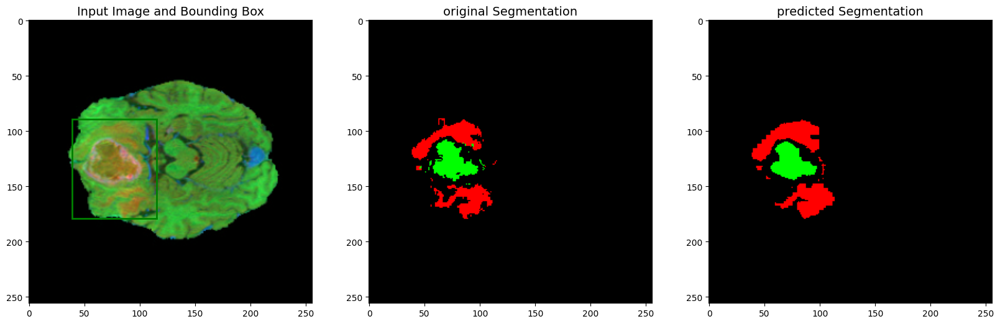

  0%|          | 11/5307 [00:01<10:16,  8.59it/s]

15
torch.Size([1, 3, 256, 256])


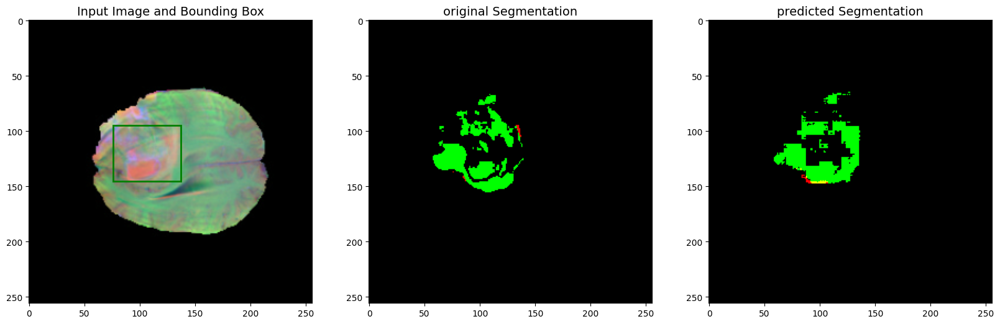

  0%|          | 16/5307 [00:03<17:52,  4.93it/s]

21
torch.Size([1, 3, 256, 256])


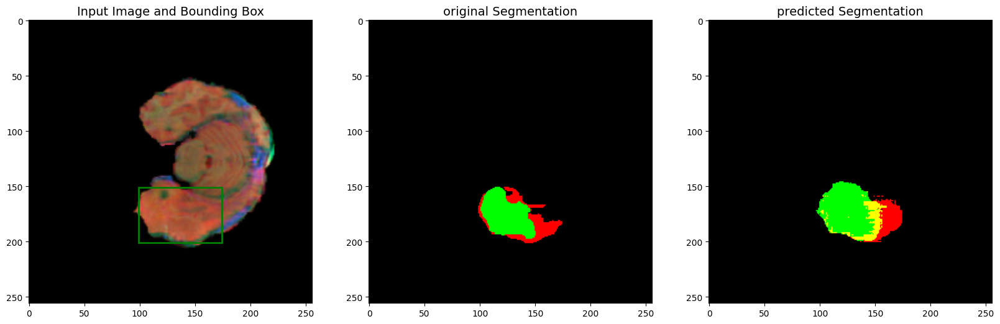

  1%|          | 27/5307 [00:04<14:04,  6.25it/s]

29
torch.Size([1, 3, 256, 256])


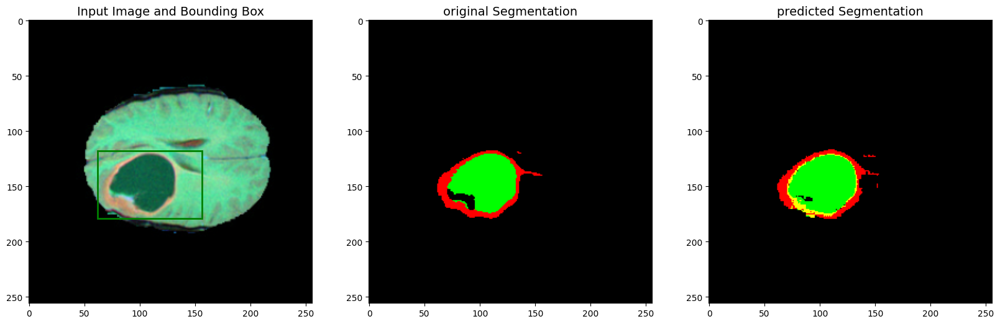

  1%|          | 30/5307 [00:06<20:27,  4.30it/s]

30
torch.Size([1, 3, 256, 256])


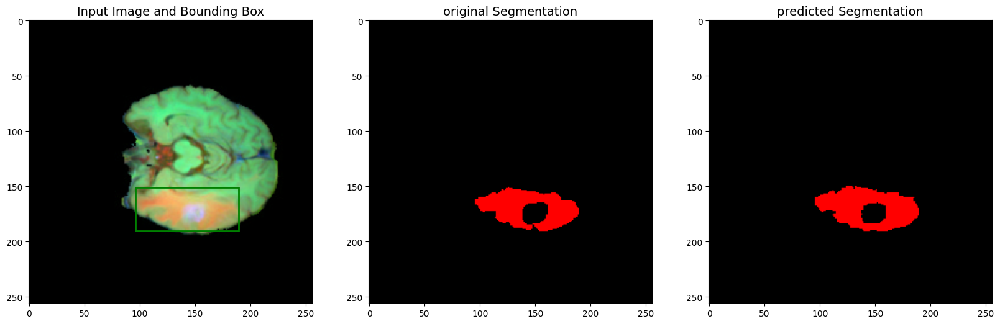

  1%|          | 42/5307 [00:08<12:08,  7.23it/s]

44
torch.Size([1, 3, 256, 256])


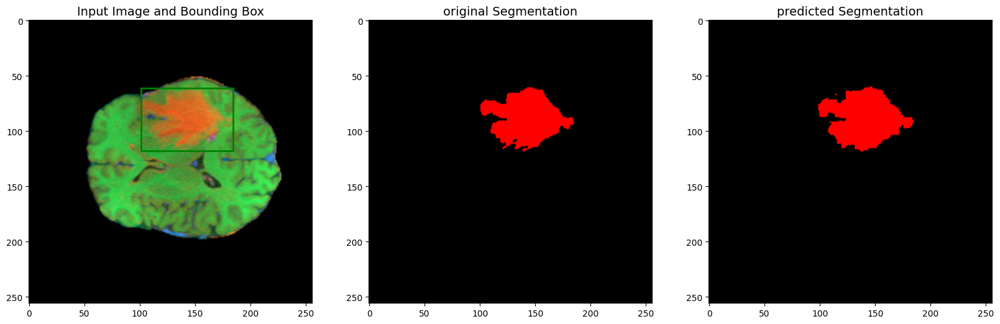

  1%|          | 46/5307 [00:09<18:16,  4.80it/s]

46
torch.Size([1, 3, 256, 256])


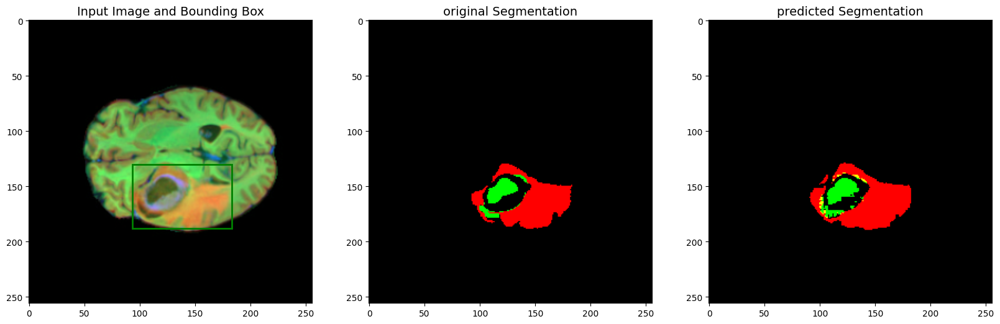

  1%|          | 49/5307 [00:10<22:23,  3.91it/s]

53
torch.Size([1, 3, 256, 256])


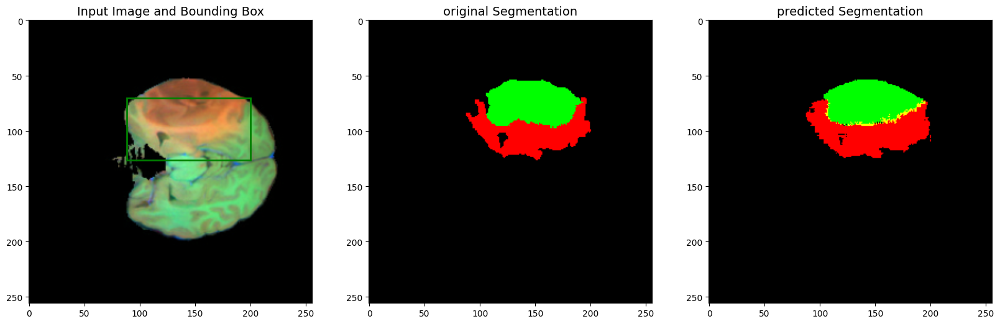

  1%|▏         | 68/5307 [00:12<08:29, 10.28it/s]

70
torch.Size([1, 3, 256, 256])


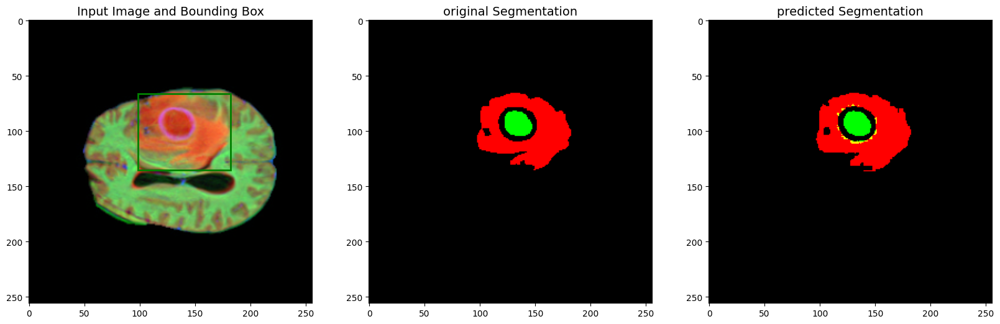

72
torch.Size([1, 3, 256, 256])


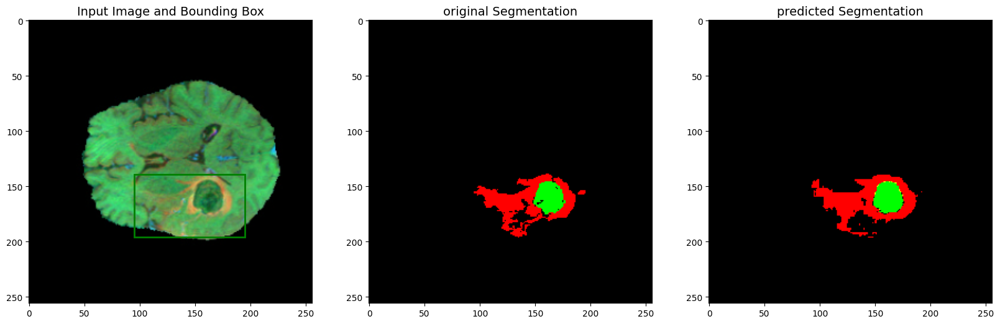

  1%|▏         | 73/5307 [00:14<16:43,  5.22it/s]

75
torch.Size([1, 3, 256, 256])


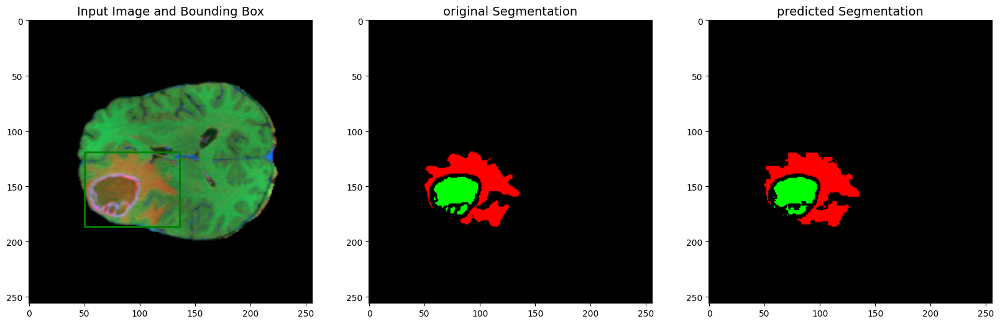

  1%|▏         | 76/5307 [00:15<20:04,  4.34it/s]

78
torch.Size([1, 3, 256, 256])


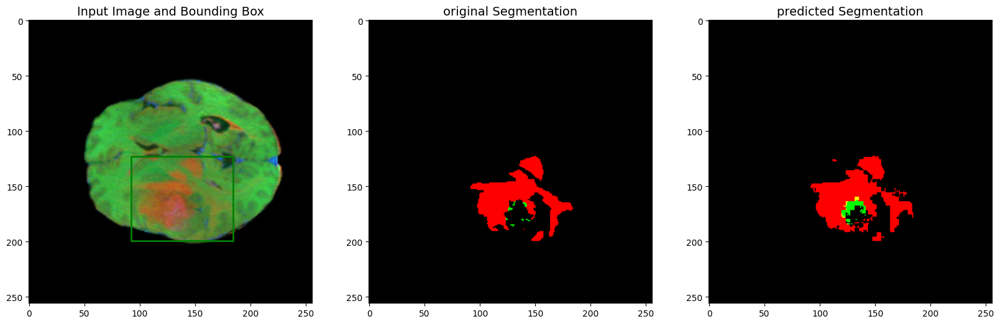

  1%|▏         | 79/5307 [00:16<22:46,  3.83it/s]

82
torch.Size([1, 3, 256, 256])


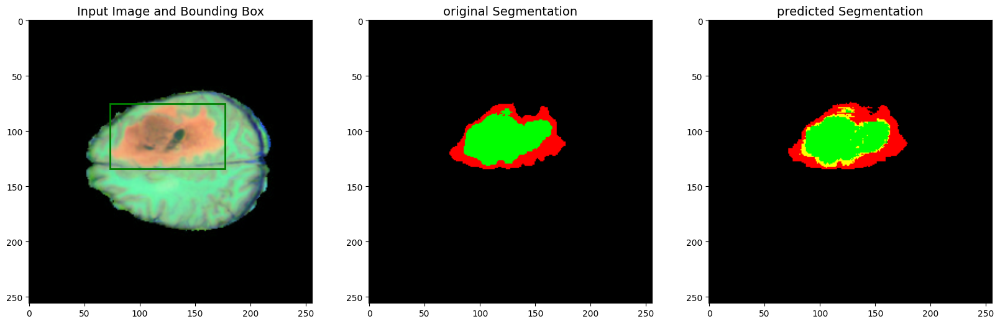

  2%|▏         | 83/5307 [00:18<28:16,  3.08it/s]

86
torch.Size([1, 3, 256, 256])


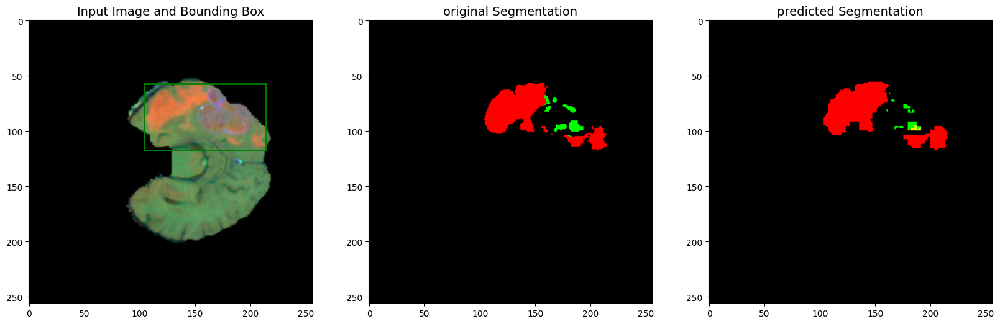

  2%|▏         | 87/5307 [00:19<27:12,  3.20it/s]

89
torch.Size([1, 3, 256, 256])


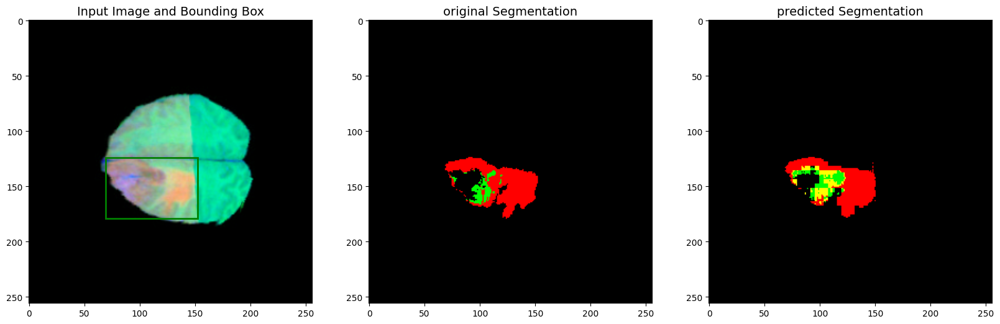

  2%|▏         | 90/5307 [00:21<30:48,  2.82it/s]

90
torch.Size([1, 3, 256, 256])


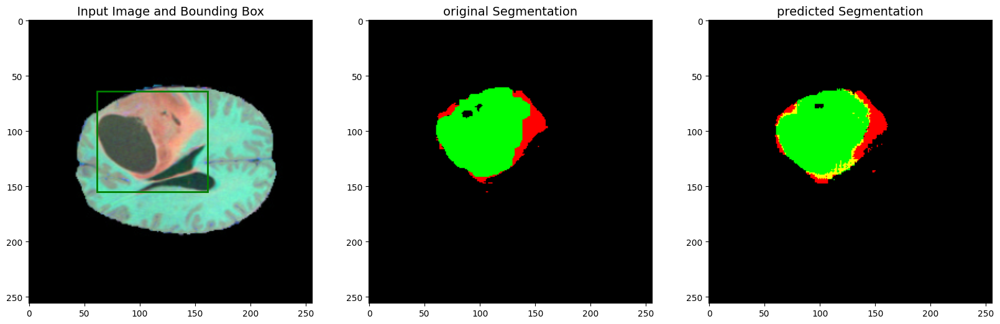

  2%|▏         | 95/5307 [00:22<26:31,  3.27it/s]

98
torch.Size([1, 3, 256, 256])


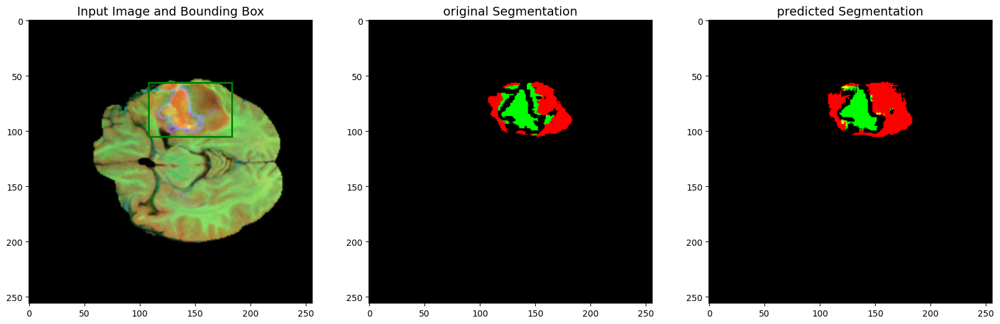

  2%|▏         | 114/5307 [00:24<09:19,  9.28it/s]

114
torch.Size([1, 3, 256, 256])


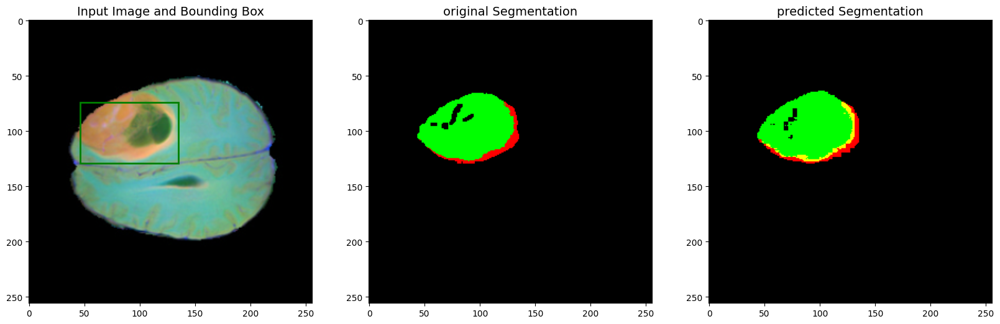

  2%|▏         | 117/5307 [00:26<17:08,  5.05it/s]

117
torch.Size([1, 3, 256, 256])


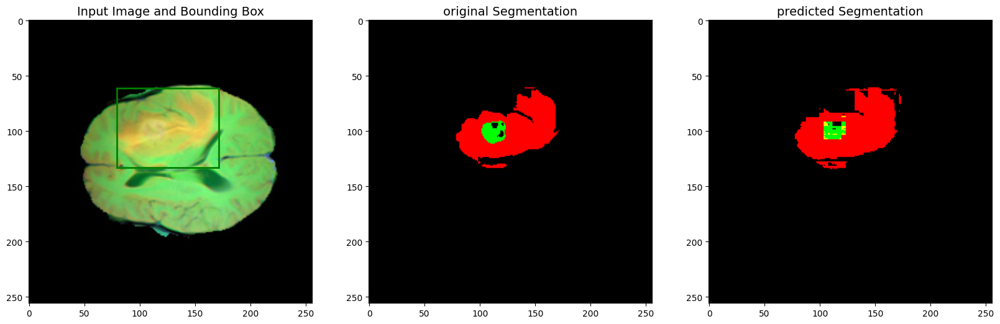

  2%|▏         | 120/5307 [00:27<22:03,  3.92it/s]

122
torch.Size([1, 3, 256, 256])


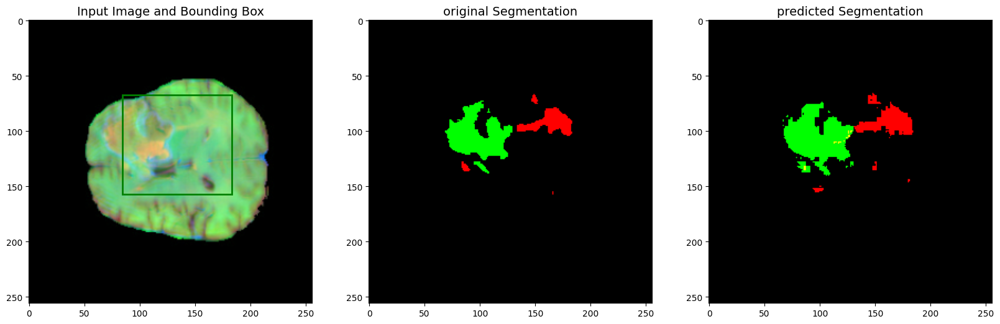

  2%|▏         | 128/5307 [00:28<16:19,  5.29it/s]

131
torch.Size([1, 3, 256, 256])


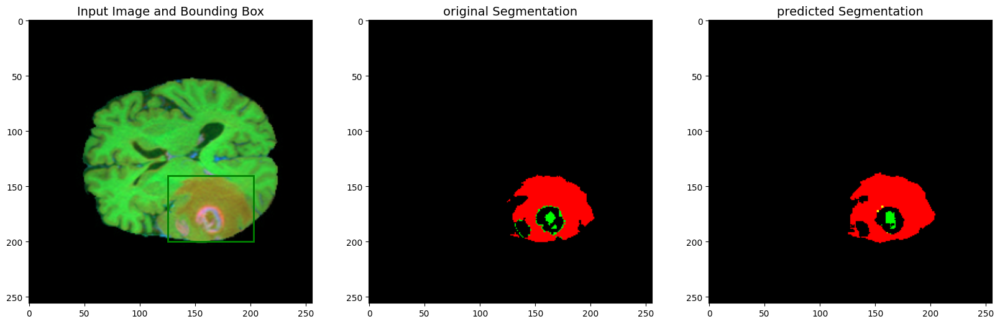

  2%|▏         | 132/5307 [00:30<19:06,  4.51it/s]

132
torch.Size([1, 3, 256, 256])


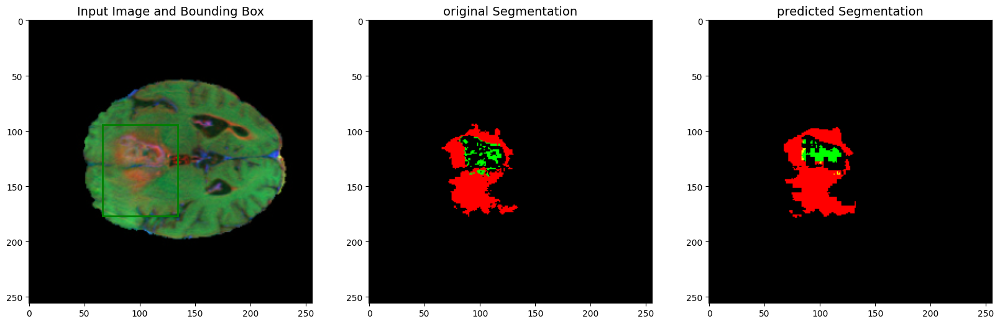

  3%|▎         | 134/5307 [00:31<24:47,  3.48it/s]

136
torch.Size([1, 3, 256, 256])


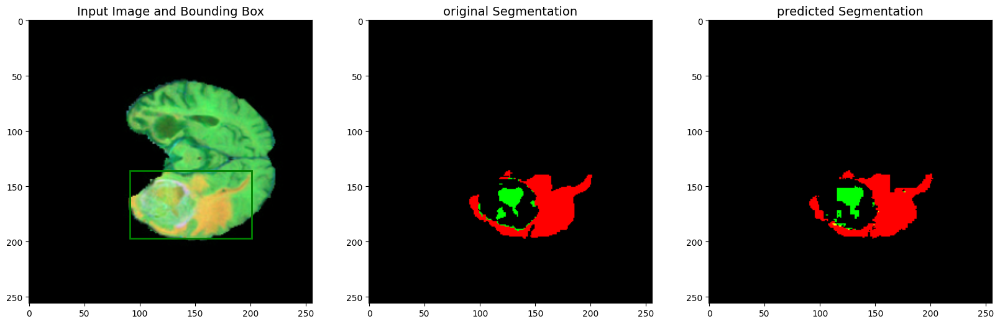

  3%|▎         | 137/5307 [00:32<27:18,  3.15it/s]

139
torch.Size([1, 3, 256, 256])


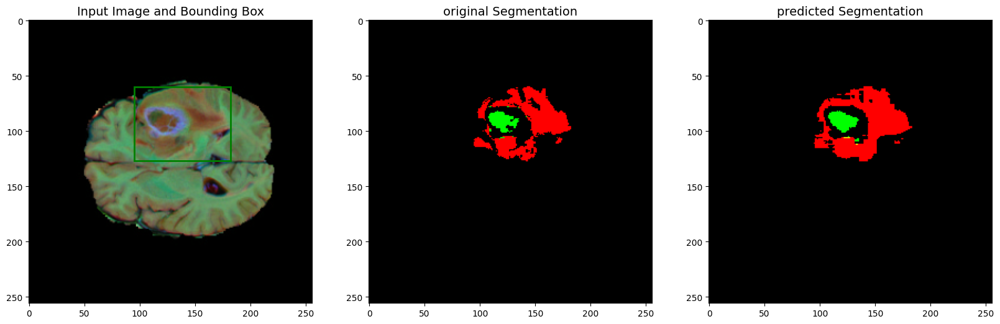

  3%|▎         | 140/5307 [00:33<28:53,  2.98it/s]

140
torch.Size([1, 3, 256, 256])


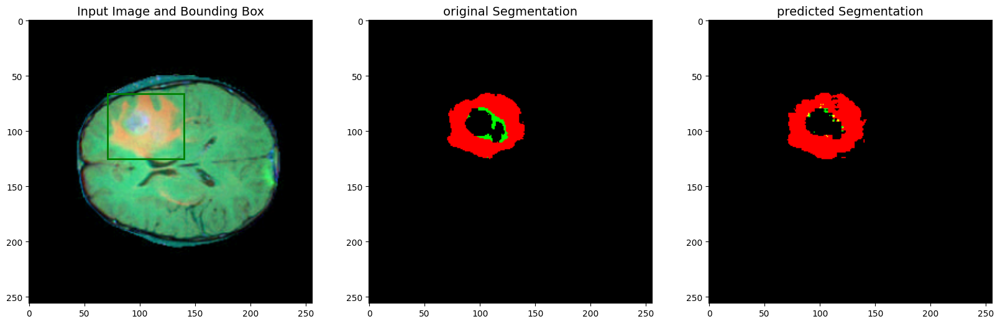

  3%|▎         | 141/5307 [00:34<36:56,  2.33it/s]

145
torch.Size([1, 3, 256, 256])


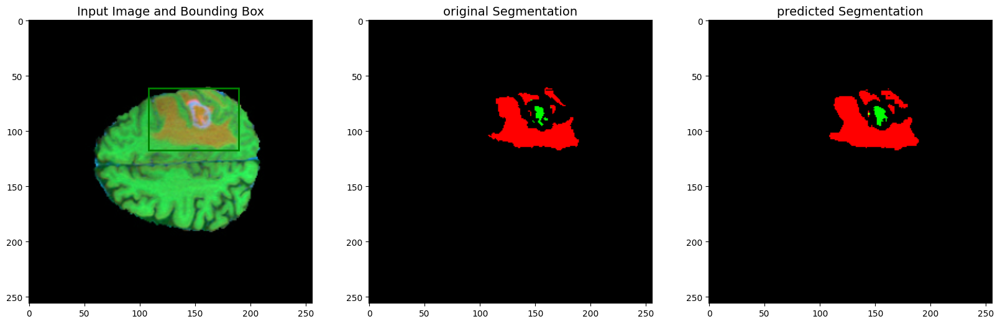

  3%|▎         | 146/5307 [00:35<29:26,  2.92it/s]

148
torch.Size([1, 3, 256, 256])


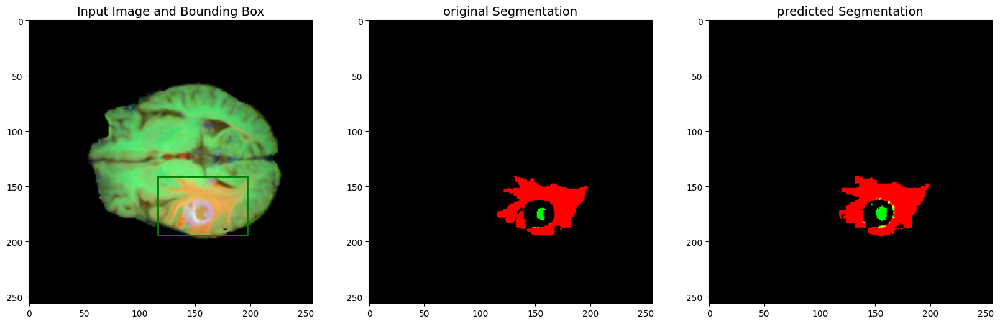

  3%|▎         | 149/5307 [00:37<30:22,  2.83it/s]

150
torch.Size([1, 3, 256, 256])


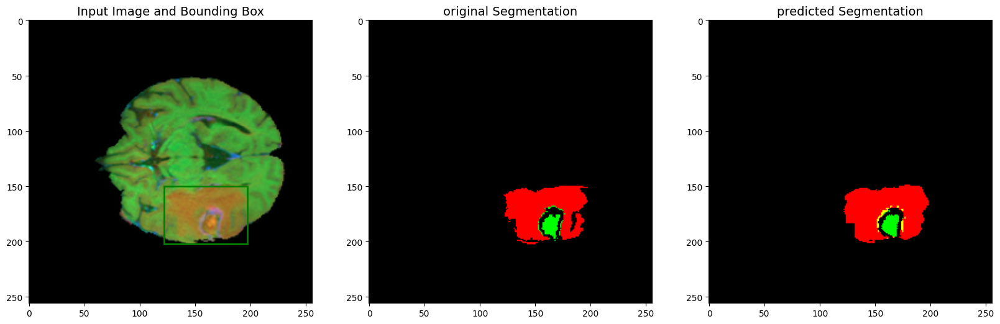

  3%|▎         | 165/5307 [00:38<10:28,  8.18it/s]

169
torch.Size([1, 3, 256, 256])


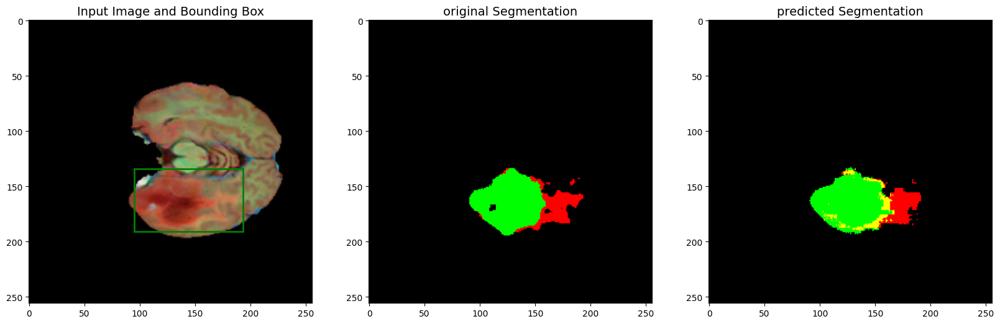

  3%|▎         | 170/5307 [00:40<16:08,  5.30it/s]

170
torch.Size([1, 3, 256, 256])


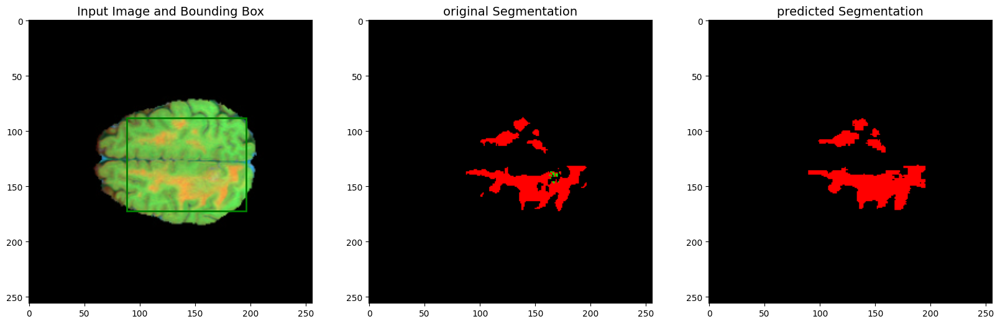

  3%|▎         | 176/5307 [00:41<16:52,  5.07it/s]

180
torch.Size([1, 3, 256, 256])


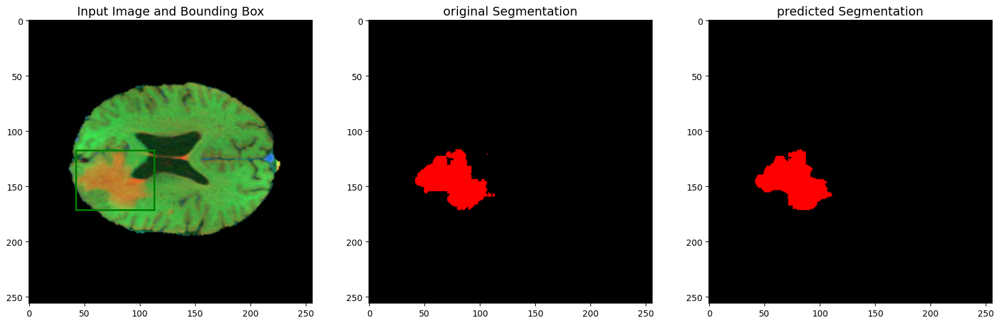

  4%|▍         | 201/5307 [00:43<05:41, 14.95it/s]

201
torch.Size([1, 3, 256, 256])


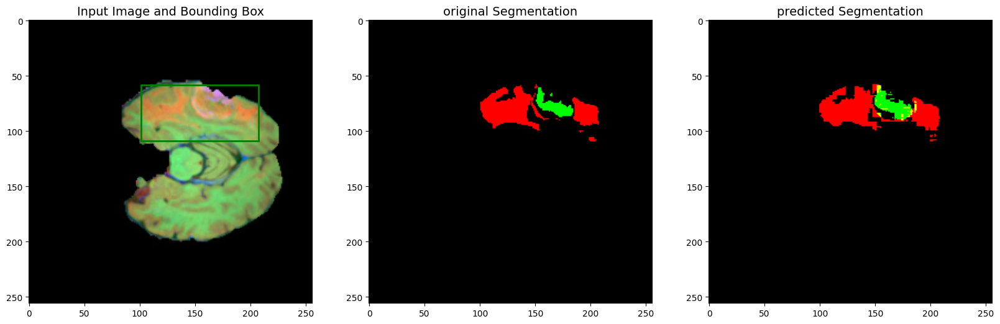

202
torch.Size([1, 3, 256, 256])


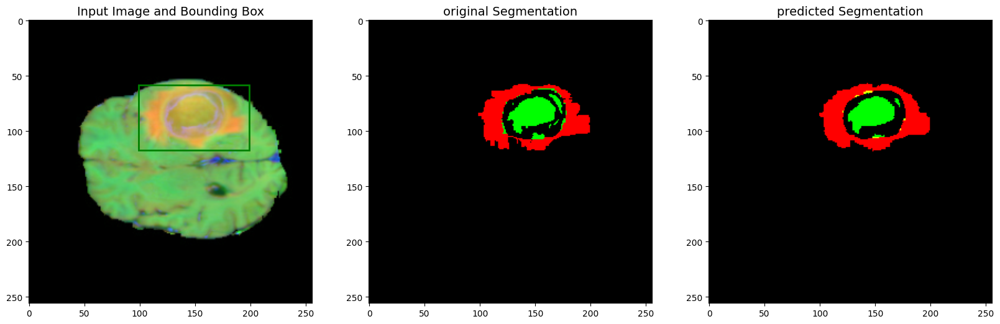

  4%|▍         | 205/5307 [00:46<17:52,  4.76it/s]

207
torch.Size([1, 3, 256, 256])


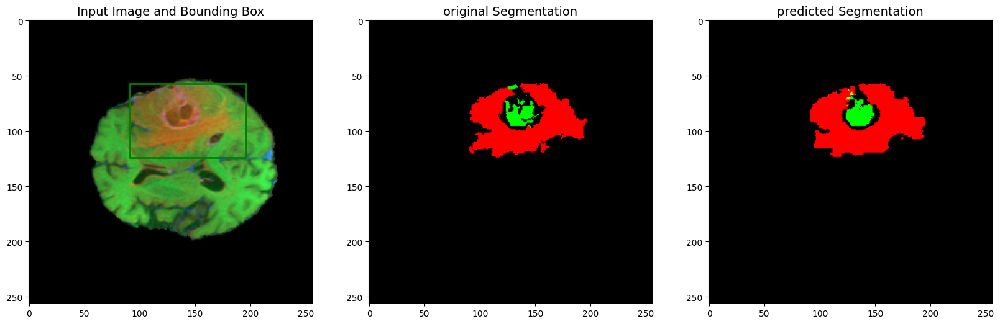

  4%|▍         | 208/5307 [00:47<21:24,  3.97it/s]

209
torch.Size([1, 3, 256, 256])


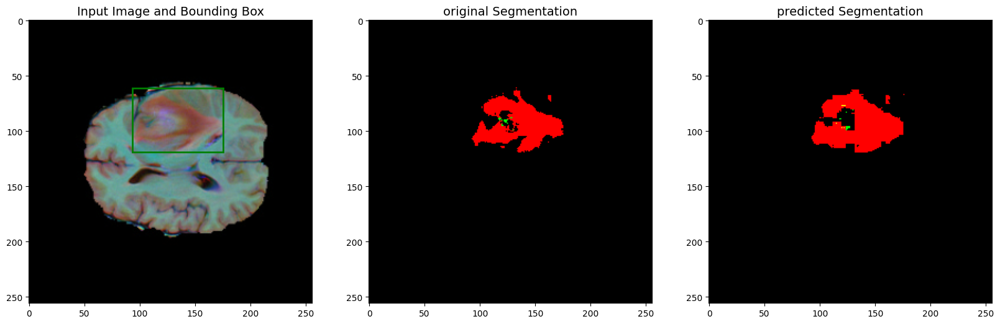

  4%|▍         | 215/5307 [00:48<16:40,  5.09it/s]

217
torch.Size([1, 3, 256, 256])


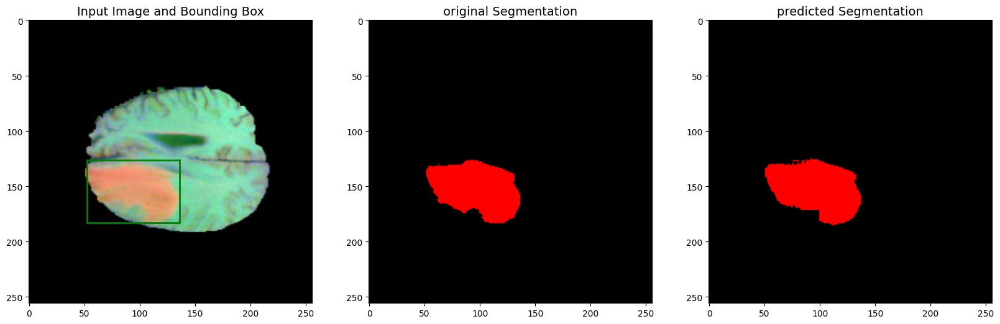

  4%|▍         | 230/5307 [00:50<08:41,  9.74it/s]

234
torch.Size([1, 3, 256, 256])


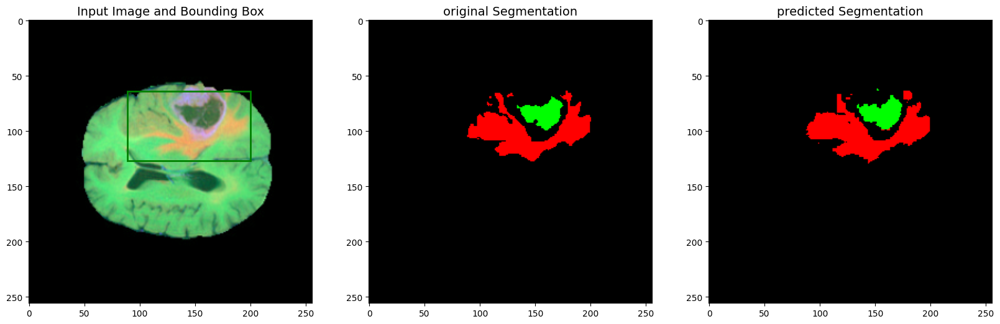

  4%|▍         | 235/5307 [00:52<15:27,  5.47it/s]

237
torch.Size([1, 3, 256, 256])


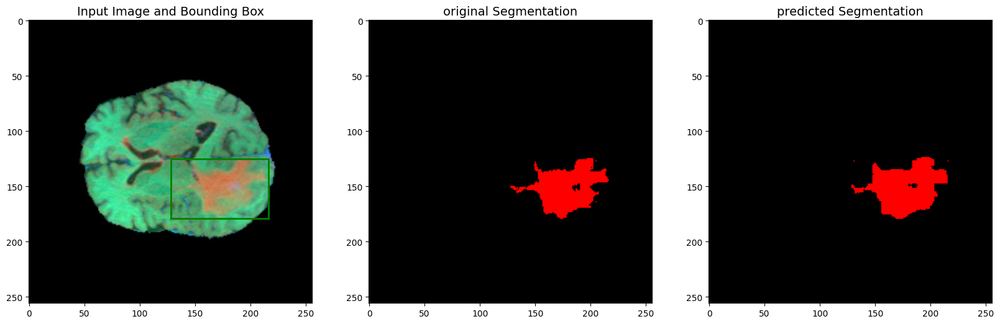

  4%|▍         | 238/5307 [00:53<19:07,  4.42it/s]

242
torch.Size([1, 3, 256, 256])


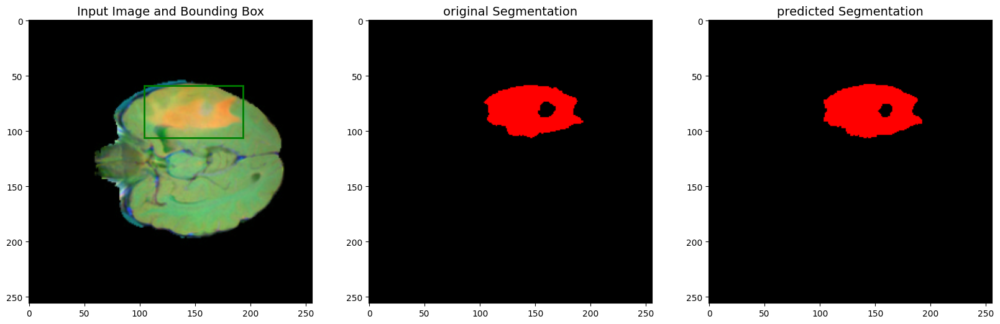

  5%|▍         | 243/5307 [00:54<19:26,  4.34it/s]

245
torch.Size([1, 3, 256, 256])


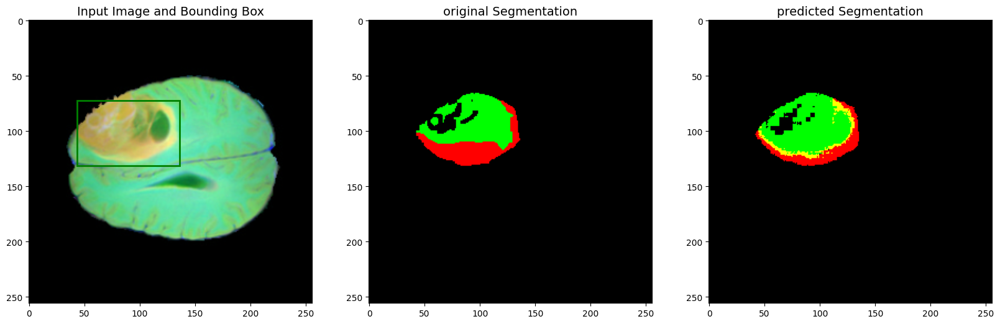

  5%|▍         | 253/5307 [00:56<14:34,  5.78it/s]

253
torch.Size([1, 3, 256, 256])


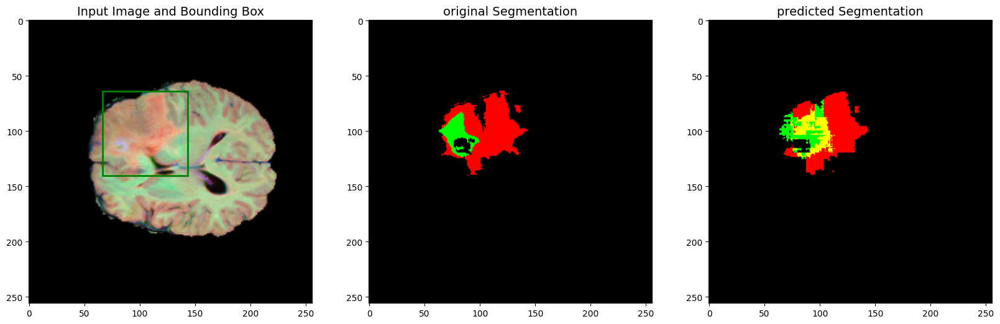

  5%|▍         | 256/5307 [00:57<20:46,  4.05it/s]

259
torch.Size([1, 3, 256, 256])


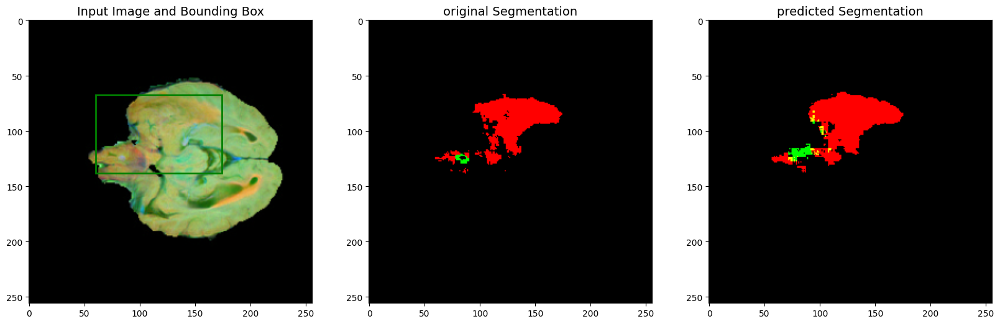

  5%|▌         | 272/5307 [00:59<10:57,  7.66it/s]

272
torch.Size([1, 3, 256, 256])


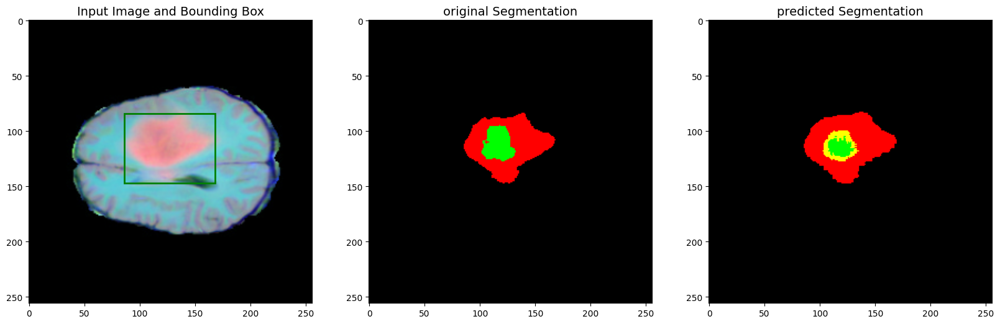

  5%|▌         | 275/5307 [01:01<17:26,  4.81it/s]

275
torch.Size([1, 3, 256, 256])


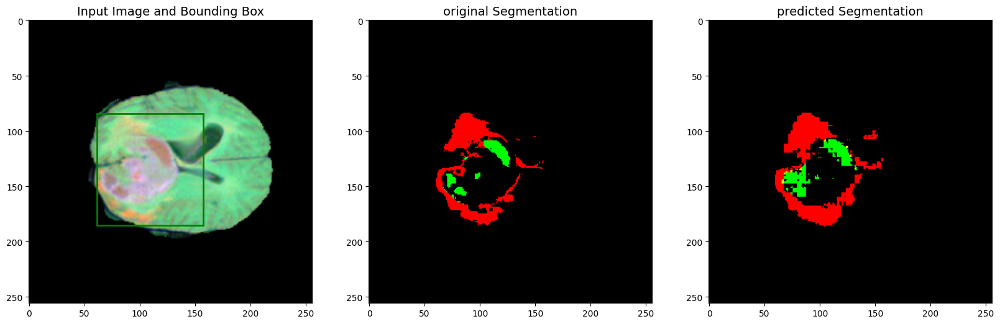

  5%|▌         | 278/5307 [01:02<23:06,  3.63it/s]

278
torch.Size([1, 3, 256, 256])


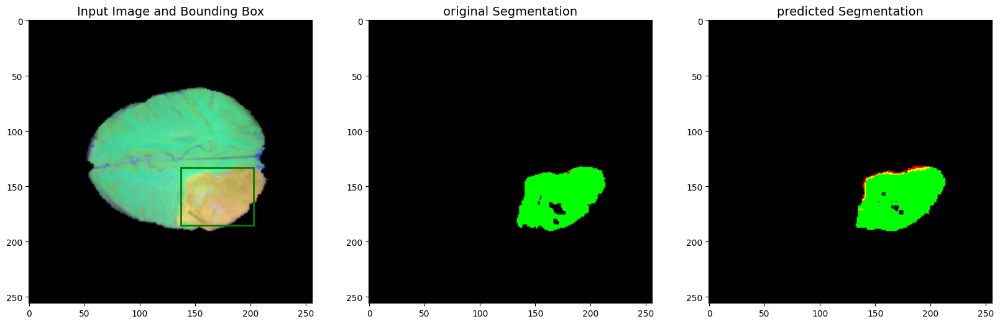

  5%|▌         | 285/5307 [01:03<17:40,  4.74it/s]

285
torch.Size([1, 3, 256, 256])


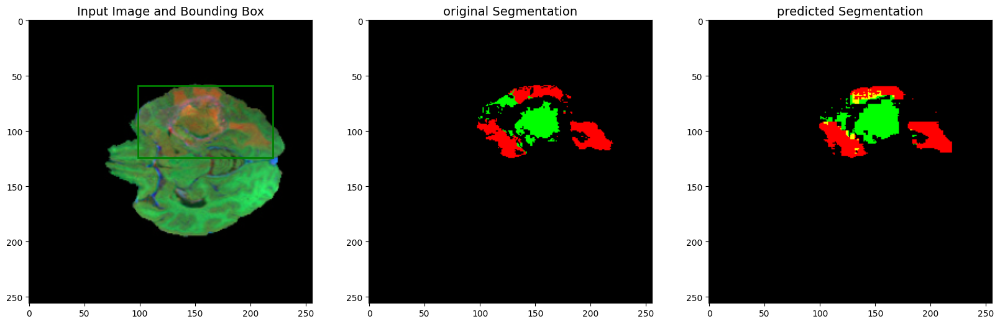

  6%|▌         | 301/5307 [01:05<08:20, 10.01it/s]

304
torch.Size([1, 3, 256, 256])


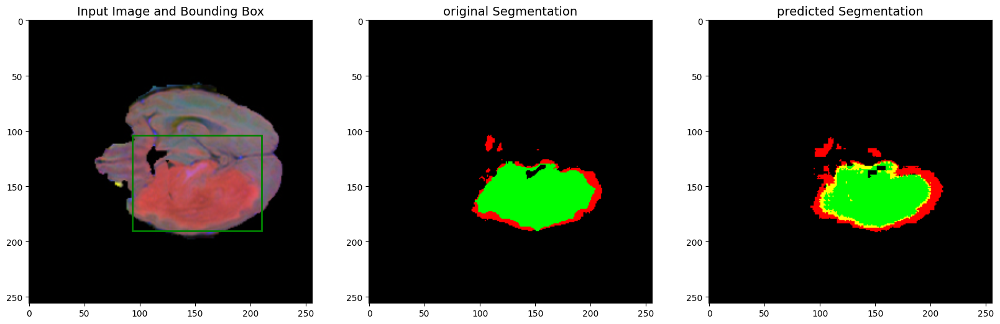

  6%|▋         | 332/5307 [01:07<03:30, 23.58it/s]

335
torch.Size([1, 3, 256, 256])


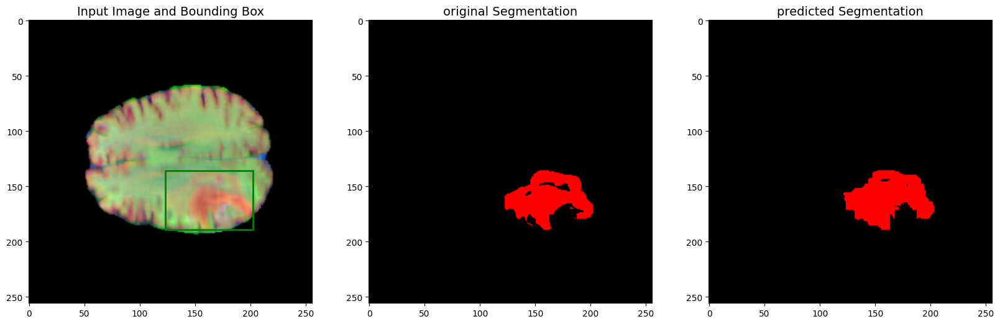

  6%|▋         | 343/5307 [01:08<06:01, 13.73it/s]

347
torch.Size([1, 3, 256, 256])


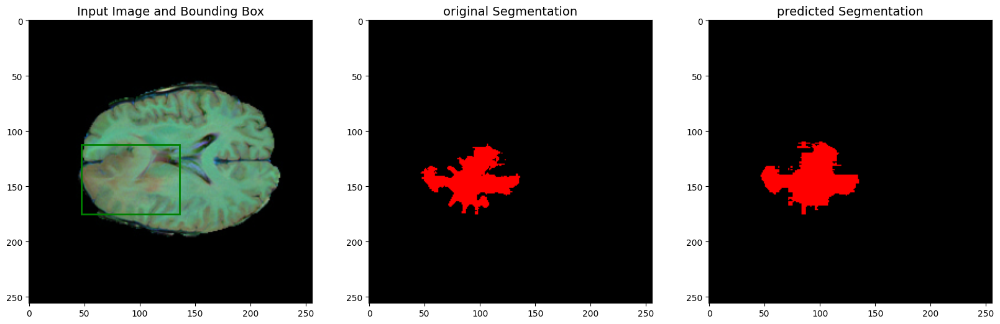

  7%|▋         | 353/5307 [01:09<07:45, 10.63it/s]

354
torch.Size([1, 3, 256, 256])


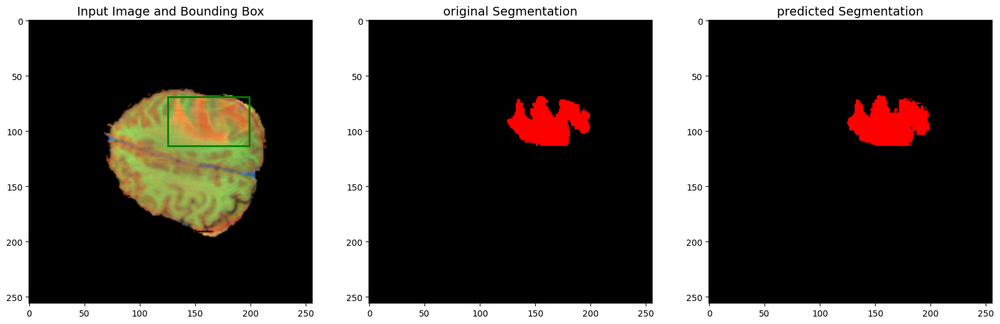

356
torch.Size([1, 3, 256, 256])


  7%|▋         | 356/5307 [01:11<16:37,  4.96it/s]


KeyboardInterrupt: ignored

In [ ]:
img = []
for step, (image_embedding, gt2D, boxes) in enumerate(tqdm(valid_dl)):

  # if step == 1:
    global img_temp
    val, counts = np.unique(gt2D, return_counts=True)
    if(1 - (counts[0]/counts.sum())) > 0.01:
      print(step)
      img_temp = image_embedding
      trans_image = img_temp.float()
      trans_image = trans_image.to(device)
      image = trans_image
      mask = gt2D
      mask = mask.squeeze(0)
      mask = (mask.permute(1,2,0))
      bbox = boxes
      img_3c = img_temp.squeeze(0)
      img_3c = img_3c.permute(1,2,0).cpu().numpy()
      B,C,H, W, = img_temp.shape
      box_np = np.array(bbox)
      box_1024 = box_np / np.array([W, H, W, H]) * 1024
      medsam_seg = sam_inference(usam_model, image, box_1024, H, W)

      #%% visualize results
      img.append([img_3c, mask, medsam_seg*255,box_np])
      fig, ax = plt.subplots(1, 3, figsize=(20, 20))
      ax[0].imshow(img_3c)
      show_box(box_np, ax[0])
      ax[0].set_title("Input Image and Bounding Box",fontsize= 14)
      ax[1].imshow(img_3c)
      ax[1].imshow(mask)
      ax[1].set_title("original Segmentation",fontsize= 14)
      ax[2].imshow(medsam_seg*255)
      # show_mask(medsam_seg, ax[2])
      # show_box(box_np, ax[1])
      ax[2].set_title("predicted Segmentation",fontsize= 14)
      # show_box(box_np, ax[2])
      plt.show()
      if step == 2:
        break

In [ ]:
dir(valid_dl.__iter__().__next__)

['__call__',
 '__class__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__func__',
 '__ge__',
 '__get__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__self__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__']

### Plot teaser

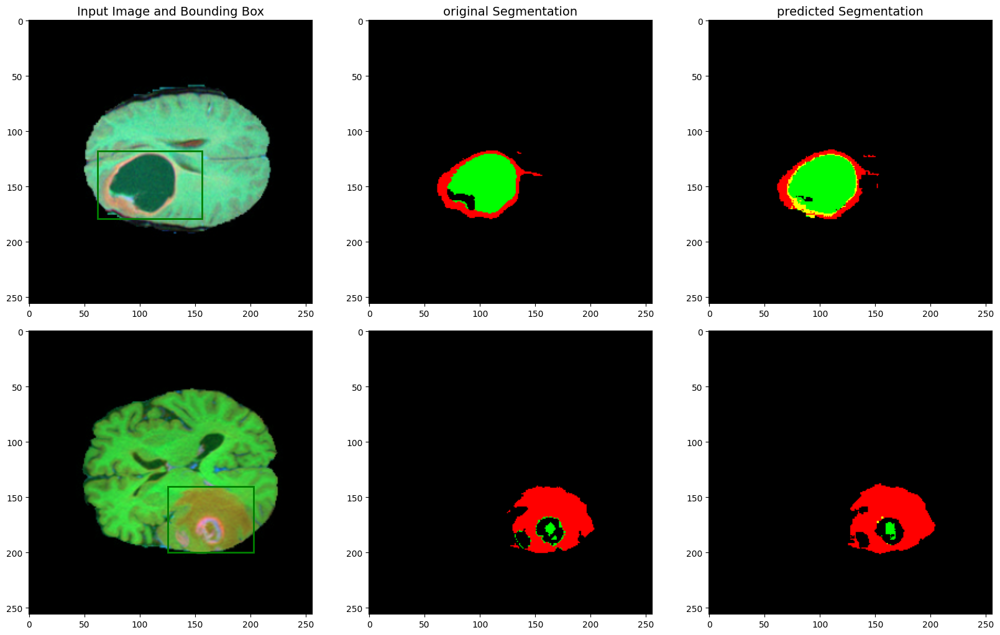

In [ ]:
fig, ax = plt.subplots(2,3,figsize=(20, 25))#,gridspec_kw={'hspace': 0.05}

ax[0,0].imshow(img[3][0])
show_box(img[3][3], ax[0,0])
ax[0,0].set_title("Input Image and Bounding Box",fontsize= 14)
ax[0,1].imshow(img[3][1])
ax[0,1].set_title("original Segmentation",fontsize= 14)
ax[0,2].imshow(img[3][2])
ax[0,2].set_title("predicted Segmentation",fontsize= 14)

ax[1,0].imshow(img[20][0])
show_box(img[20][3], ax[1,0])
# ax[1,0].set_title("Input Image and Bounding Box",fontsize= 14)
ax[1,1].imshow(img[20][1])
# ax[1,1].set_title("original Segmentation",fontsize= 14)
ax[1,2].imshow(img[20][2])

plt.subplots_adjust(bottom=0.3, top=0.7, hspace=0)


# plt.suptitle('Something')
